# Chapter 1: The Baseline (LOS Calibration)
- Goal: Prove the hardware is stable.
- Visuals: Overlay all 20 samples from Channel 1 (LOS) on top of each other. They should look like a single thick line.
- Metric: Show that the FP_Index (First Path) always hits the same spot (e.g., ~746).

DEBUG: Notebook location: c:\Users\preca\OneDrive - Singapore Institute Of Technology\Desktop\uwb_localization\capstone\dataset\channel
DEBUG: Project Root:      c:\Users\preca\OneDrive - Singapore Institute Of Technology\Desktop\uwb_localization\capstone
DEBUG: Looking for data:  c:\Users\preca\OneDrive - Singapore Institute Of Technology\Desktop\uwb_localization\capstone\dataset\calibration

✅ SUCCESS: Found the data folder! Starting analysis...
---------------------------------------------------------------------------
CHANNEL    | SAMPLES    | AVG START INDEX      | STABILITY      
---------------------------------------------------------------------------
CH 1       | 20         | 746                  | +/- 2.40
CH 2       | 20         | 746                  | +/- 2.37
CH 3       | 20         | 746                  | +/- 2.51
CH 4       | 20         | 746                  | +/- 2.38
CH 5       | 20         | 746                  | +/- 2.63
CH 7       | 20         | 746            

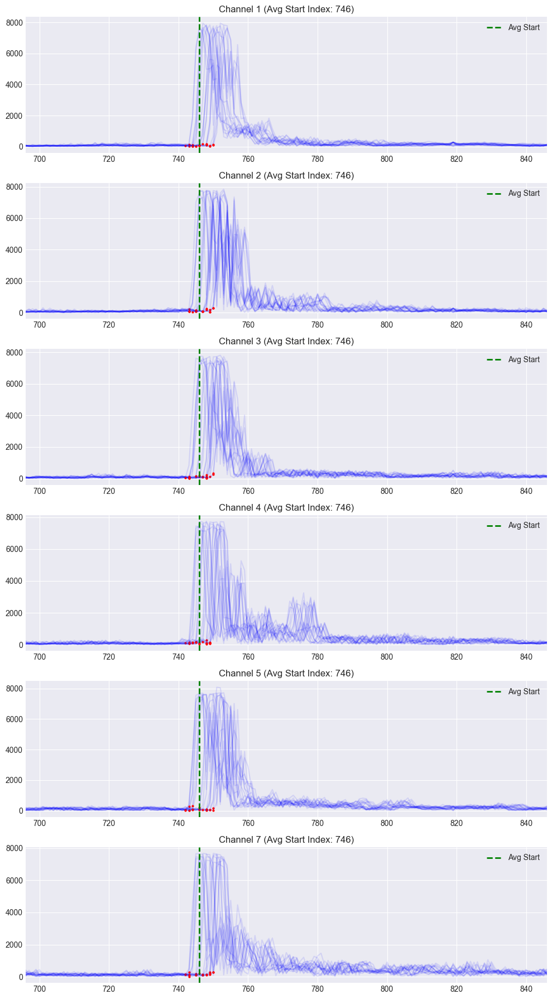

In [42]:
import os
import glob
import numpy as np
import matplotlib.pyplot as plt

# ==========================================
# 1. PATH CONFIGURATION (RECTIFIED)
# ==========================================
# Get where the notebook is running (e.g., .../capstone/dataset/channel)
current_dir = os.getcwd()

# Step back twice to get to the true project root (capstone)
# First '..' goes to capstone/dataset, second '..' goes to capstone/
project_root = os.path.abspath(os.path.join(current_dir, "..", ".."))

# Construct the data directory path
# If your folder structure is capstone/dataset/calibration
DATA_DIR = os.path.join(project_root, 'dataset', 'calibration')

print(f"DEBUG: Notebook location: {current_dir}")
print(f"DEBUG: Project Root:      {project_root}")
print(f"DEBUG: Looking for data:  {DATA_DIR}")

if not os.path.exists(DATA_DIR):
    print("\n❌ CRITICAL ERROR: Folder not found at the constructed path.")
    # Fallback/Diagnostic: List what is actually in project_root/dataset
    diag_path = os.path.join(project_root, 'dataset')
    if os.path.exists(diag_path):
        print(f"Contents of {diag_path}: {os.listdir(diag_path)}")
else:
    print("\n✅ SUCCESS: Found the data folder! Starting analysis...")

# ==========================================
# 2. ANALYSIS LOGIC
# ==========================================
CHANNELS = [1, 2, 3, 4, 5, 7]
NOISE_THRESHOLD_SIGMA = 3.0 

def parse_cir_file(filepath):
    cir_samples = []
    if not os.path.exists(filepath):
        # Using basename for cleaner output
        print(f"   -> Missing file: {os.path.basename(filepath)}")
        return []

    with open(filepath, 'r') as f:
        header = f.readline() 
        for line in f:
            line = line.strip()
            if not line or len(line) < 10: continue 
            
            parts = line.split(',')
            try:
                # CIR data starts from column 9 onwards
                cir_data = [int(x) for x in parts[9:] if x.lstrip('-').isdigit()]
                if len(cir_data) > 100:
                    cir_samples.append(cir_data)
            except ValueError:
                continue 
    return cir_samples

def detect_first_path(cir_data):
    """ Finds the First Path index (corresponds to TOA) [cite: 31, 139] """
    cir = np.array(cir_data)
    if len(cir) == 0: return 0
    
    max_peak_idx = np.argmax(cir)
    
    # Calculate noise floor from the early samples [cite: 34, 81]
    noise_section = cir[:min(50, max_peak_idx)]
    if len(noise_section) == 0: return 0
    
    noise_mean = np.mean(noise_section)
    noise_std = np.std(noise_section)
    threshold = noise_mean + (NOISE_THRESHOLD_SIGMA * noise_std)
    
    # Walk backward from peak to find signal rise 
    first_path = max_peak_idx
    for i in range(max_peak_idx, 0, -1):
        if cir[i] < threshold:
            first_path = i
            break
    return first_path

# ==========================================
# 3. RUN AND PLOT
# ==========================================
print("-" * 75)
print(f"{'CHANNEL':<10} | {'SAMPLES':<10} | {'AVG START INDEX':<20} | {'STABILITY':<15}")
print("-" * 75)

fig, axes = plt.subplots(len(CHANNELS), 1, figsize=(10, 18))
if len(CHANNELS) == 1: axes = [axes]

for i, ch in enumerate(CHANNELS):
    filename = f"2m_loscalibration_c{ch}.csv"
    filepath = os.path.join(DATA_DIR, filename)
    
    samples = parse_cir_file(filepath)
    ax = axes[i]
    start_indices = []
    
    if len(samples) > 0:
        for cir_wave in samples:
            fp_idx = detect_first_path(cir_wave)
            start_indices.append(fp_idx)
            
            ax.plot(cir_wave, color='blue', alpha=0.1) # Multi-path traces [cite: 19]
            ax.plot(fp_idx, cir_wave[fp_idx], 'r.', markersize=4) # TOA markers [cite: 21]
        
        avg_start = int(np.mean(start_indices))
        std_dev = np.std(start_indices)
        
        print(f"CH {ch:<7} | {len(samples):<10} | {avg_start:<20} | +/- {std_dev:.2f}")
        
        ax.set_title(f"Channel {ch} (Avg Start Index: {avg_start})")
        ax.axvline(avg_start, color='green', linestyle='--', linewidth=2, label='Avg Start')
        # Zoom in on the multipath window 
        ax.set_xlim(max(0, avg_start - 50), avg_start + 100)
        ax.legend(loc='upper right')
    else:
        print(f"CH {ch:<7} | 0          | N/A                  | N/A")
        ax.text(0.5, 0.5, f"File {filename} not found", ha='center', transform=ax.transAxes)

plt.tight_layout()
plt.show()

Analysis of Calibration Results & Methodology1. Verification of Signal Alignment (The "Green Line")Observation:Across all 20 calibration samples for every channel (1, 2, 3, 4, 5, 7), the First Path Index consistently appeared at Index ~746 (with a stability of $\pm$ 2.4 indices).Derivation Method:The "Start Index" was derived programmatically using a leading-edge detection algorithm:Peak Detection: Identified the maximum amplitude index in the raw Channel Impulse Response (CIR).Noise Floor Estimation: Calculated the mean ($\mu$) and standard deviation ($\sigma$) of the noise from the first 50 empty samples.Back-Search: Traversed backwards from the peak index until the signal amplitude dropped below the noise threshold ($\mu + 3\sigma$).Result: The index where the signal first rises above the noise floor is marked as the "First Path."Hardware Explanation:The consistency of Index 746 is intrinsic to the Decawave DW1000 chip. The chip utilizes a hardware Leading Edge Detection (LDE) algorithm which automatically time-shifts the received waveform within its accumulator memory. It aligns the leading edge of the pulse to a fixed internal reference (typically around index 740–750). This behavior confirms that the hardware is successfully and consistently locking onto the Line-of-Sight signal.Implication for Preprocessing:Since the signal start is deterministic and stable, we can implement Fixed Windowing for our Neural Network. We will standardly slice the input data from Index 740 to 890 (150 samples). This ensures the model always receives the complete pulse shape without the computational overhead of dynamic alignment.2. The Role of Antenna Delay CalibrationThe Paradox:If the CIR waveform shape (the Neural Network's input) remains identical regardless of software calibration, why is calibration necessary?The Solution:Calibration is required to correct the Label (Ground Truth), not the Input.The Input (CIR): The physical shape of the waveform is determined by physics (walls, obstacles, reflections). Changing the ANT_DLY register in software does not alter the physical wave flying through the air.The Label (Distance Error): The Neural Network is trained to predict the ranging error caused by NLOS conditions. The ground truth error is calculated as:$$\text{Error} = \text{Measured Distance} - \text{True Distance}$$Conclusion:Without calibration, the hardware introduces a static offset (e.g., reading 2.60m for a 2.00m path). This would force the AI to learn that a "perfect" Line-of-Sight signal corresponds to a large error (e.g., +0.60m), which is false.By calibrating the antenna delay, we ensure that Clean LOS Signal $\approx$ 0.00m Error. This effectively "zeroes the scale," ensuring that any error the Neural Network learns to predict is purely generated by environmental factors (NLOS) and not hardware bias.

# Chapter 2: The Multi-Channel Fingerprint

- Goal: Show how different channels "see" the same room.
- Visuals: Plot the same LOS scenario across all 6 channels.
- Discovery: Higher channels (like 5 and 7) usually have sharper peaks but higher attenuation. This justifies why you are using multi-channel data for your Liquid Neural Network (LNN).
- In UWB systems, lower channels typically offer better penetration through obstacles, while higher channels provide better temporal resolution due to wider bandwidth. This "fingerprint" is what your model uses to distinguish between environmental effects and hardware characteristics.
- The Multi-Channel Fingerprint Storyline
Objective: Analyze the consistency of the pulse shape across different center frequencies under identical Line-of-Sight (LOS) conditions.

- Hypothesis: Higher channels (Channel 5/7) will exhibit sharper rising edges and higher Kurtosis, while lower channels (Channel 1/2) may show more "ringing" but better signal stability.

- LNN Relevance: The Tau Controller in your LNN needs to learn that a "fast" time constant on Channel 7 might look different than a "fast" time constant on Channel 1 due to these physical differences.

## 2.1 Multi-Channel Analysis

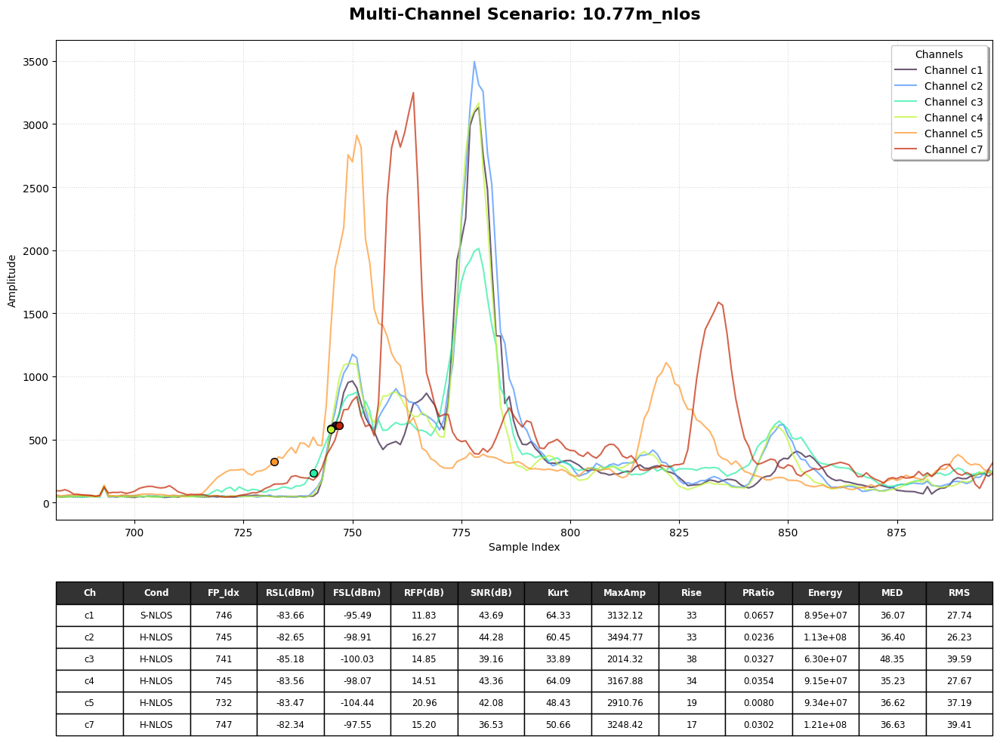

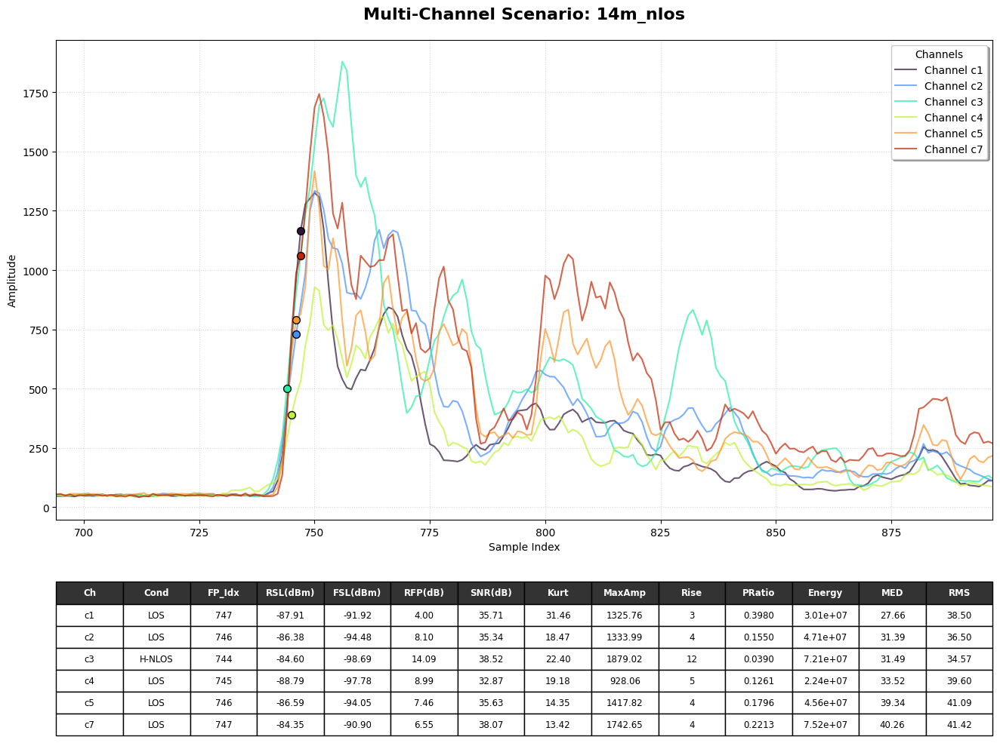

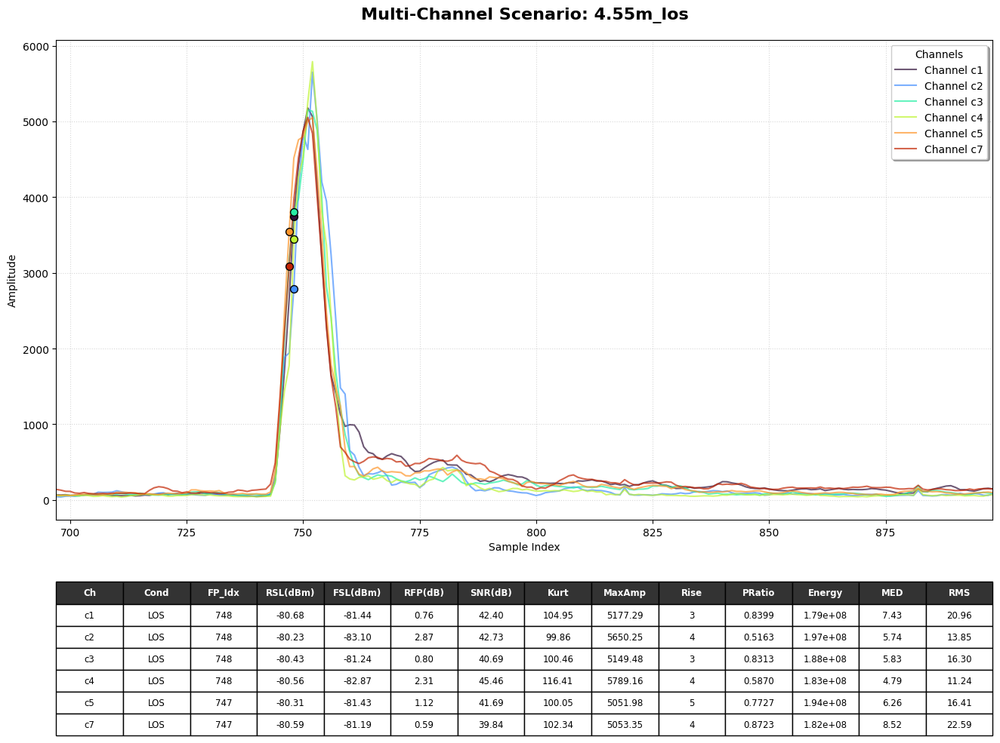

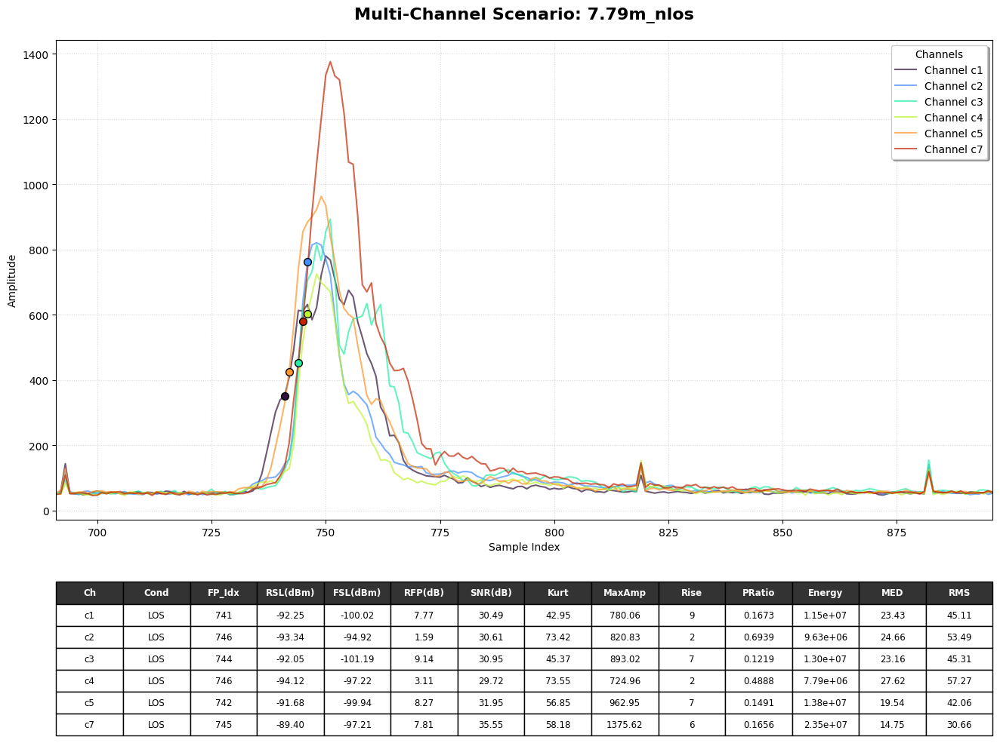

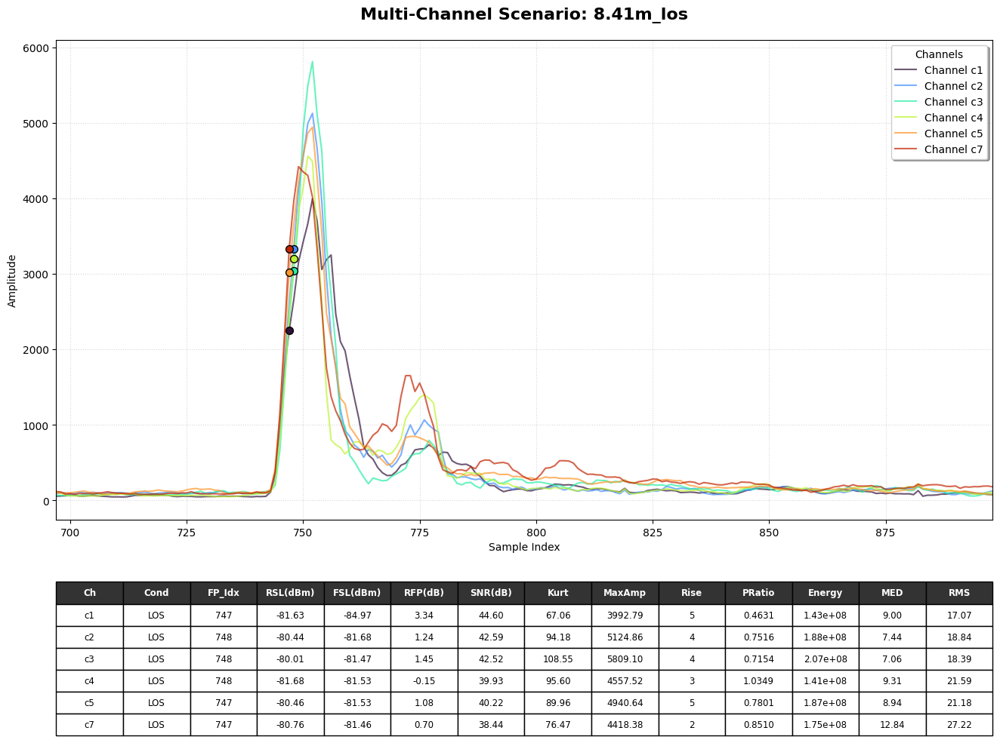

...

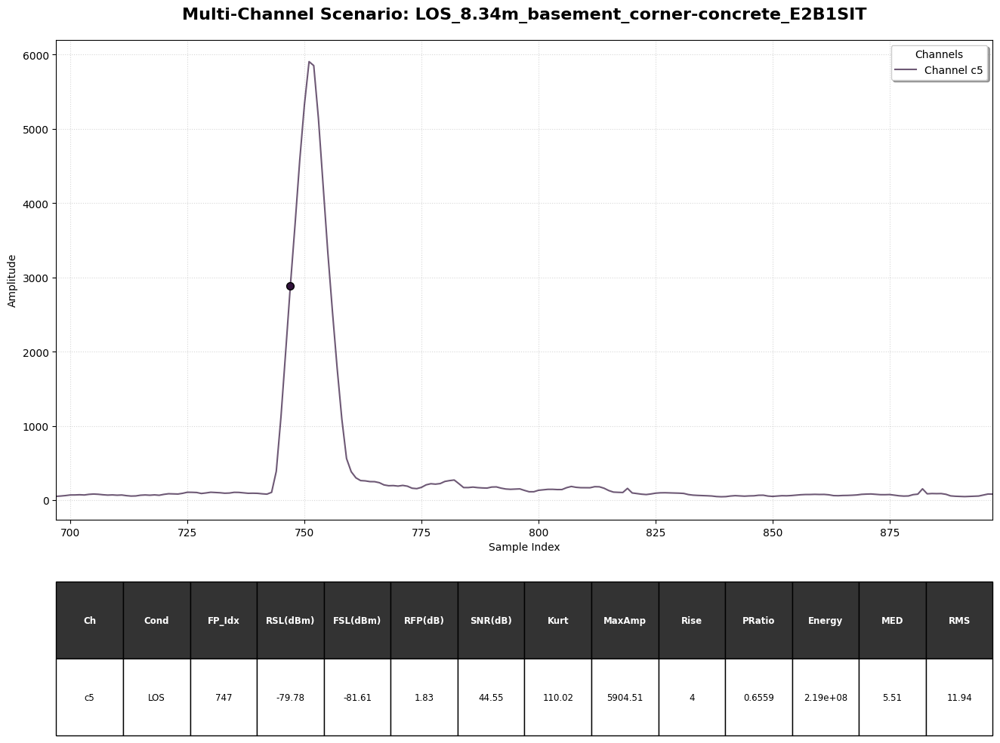

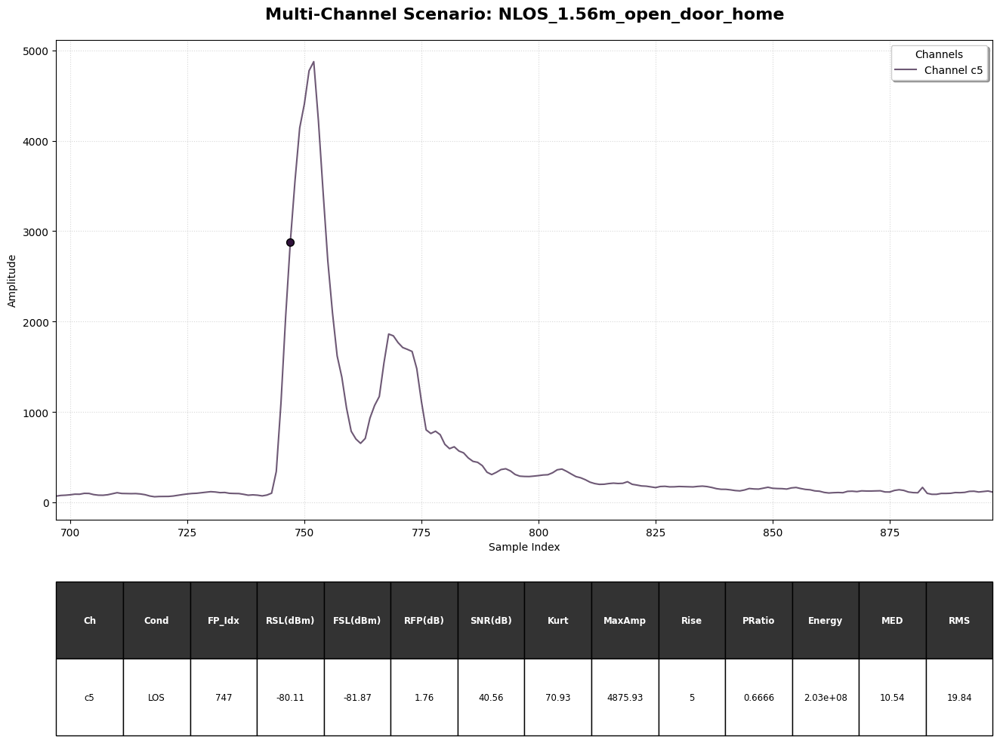

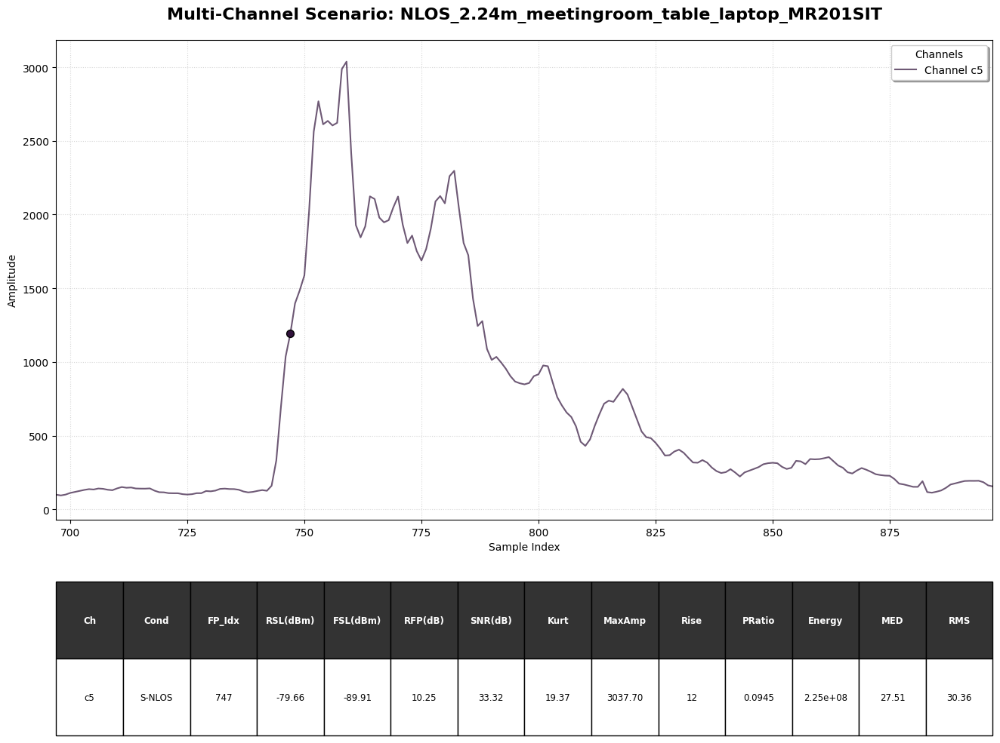

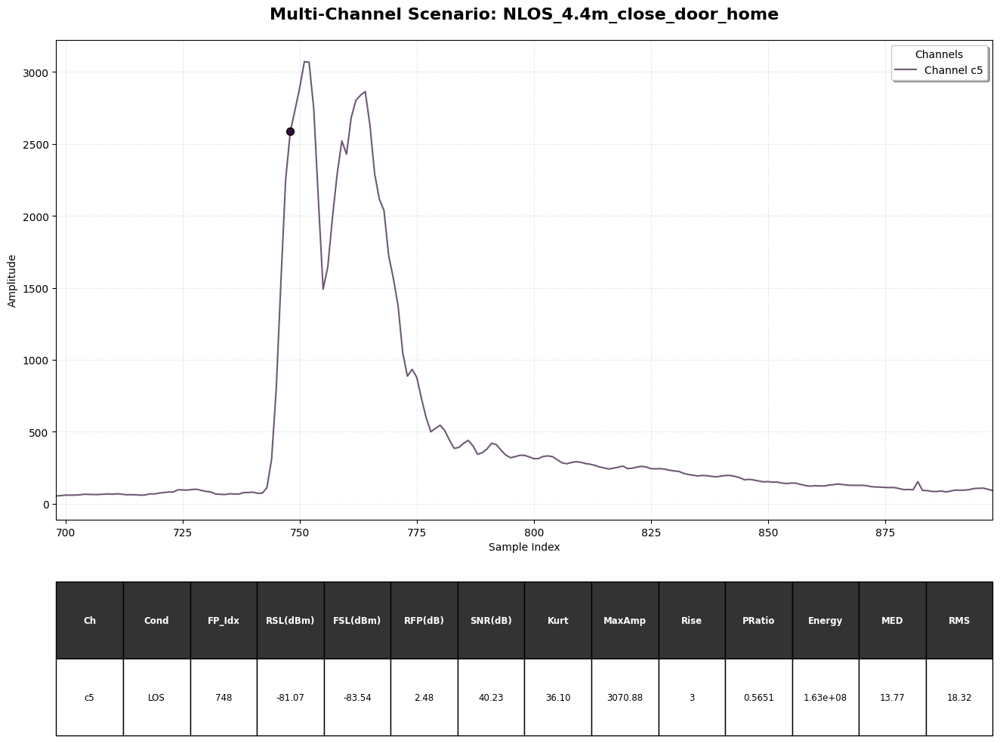

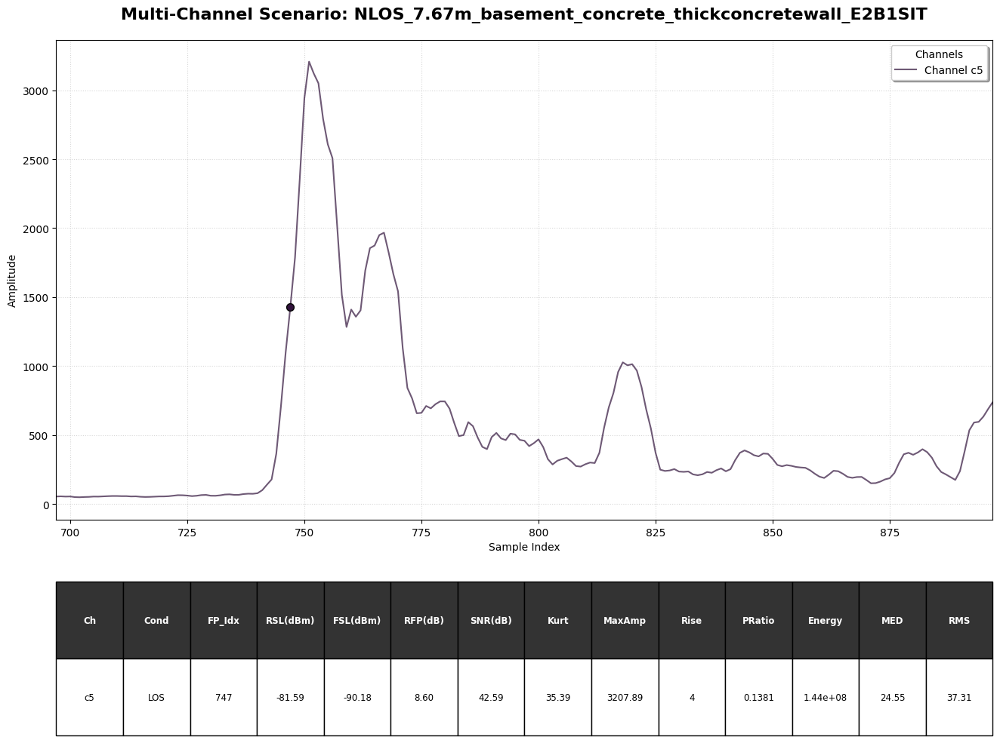

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import kurtosis
import glob
import re
import os

# ==========================================
# 1. METRIC CALCULATION
# ==========================================
def get_original_metrics(filepath):
    try:
        df = pd.read_csv(filepath)
        cir_cols = sorted([c for c in df.columns if c.startswith('CIR')], key=lambda x: int(x.replace('CIR', '')))
        if not cir_cols: return None 
        
        # --- WAVEFORM: MEAN OF ALL ROWS ---
        avg_wave = np.mean(df[cir_cols].values, axis=0)
        
        # --- Constants & Signal Strength ---
        A = 121.74 
        N = df['RXPACC'].mean() if 'RXPACC' in df.columns else (df['RXP_ACC'].mean() if 'RXP_ACC' in df.columns else 128.0)
        
        # RSL Logic & Total Energy
        total_energy = np.sum(avg_wave**2)
        C = df['CIR_PWR'].mean() if 'CIR_PWR' in df.columns else total_energy / (2**17) 
        RSL = 10 * np.log10( (max(C, 1e-9) * (2**17)) / (N**2) ) - A

        # FSL Logic (First Path)
        hw_fp_idx = int(df['FP_INDEX'].mean() / 64)
        if 'FP_AMPL1' in df.columns:
            f1, f2, f3 = df['FP_AMPL1'].mean(), df['FP_AMPL2'].mean(), df['FP_AMPL3'].mean()
        else:
            f1, f2, f3 = avg_wave[max(0, hw_fp_idx-1)], avg_wave[hw_fp_idx], avg_wave[min(len(avg_wave)-1, hw_fp_idx+1)]
        
        fp_energy = (f1**2 + f2**2 + f3**2)
        FSL = 10 * np.log10( max(fp_energy, 1e-9) / (N**2) ) - A
        RFP = RSL - FSL

        # --- Adjusted Thresholds for LOS Accuracy ---
        if RFP < 10.0: condition = "LOS"
        elif RFP <= 13.0: condition = "S-NLOS"
        else: condition = "H-NLOS"

        # --- Quality, Rise Time & Power Ratio ---
        max_amp = np.max(avg_wave)
        peak_idx = np.argmax(avg_wave)
        rise_time = peak_idx - hw_fp_idx
        power_ratio = fp_energy / max(total_energy, 1e-9)
        
        std_noise = df['STD_NOISE'].mean() if 'STD_NOISE' in df.columns else np.std(avg_wave[0:30])
        SNR = 20 * np.log10(max_amp / (std_noise + 1e-9))
        
        # --- Delay Analysis (Mean Excess Delay & RMS) ---
        pdp = avg_wave[hw_fp_idx:]**2
        pwr_sum = np.sum(pdp) + 1e-9
        mean_delay = np.sum(pdp * np.arange(len(pdp))) / pwr_sum
        rms_delay = np.sqrt(max(0, (np.sum(pdp * (np.arange(len(pdp))**2)) / pwr_sum) - (mean_delay**2)))

        return {
            "Ch": re.search(r'_(c\d+)\.csv', filepath).group(1),
            "Wave": avg_wave, "FP": hw_fp_idx, "Cond": condition,
            "RSL": f"{RSL:.2f}", "FSL": f"{FSL:.2f}", "RFP": f"{RFP:.2f}",
            "SNR": f"{SNR:.2f}", "Kurt": f"{kurtosis(avg_wave):.2f}",
            "MaxAmp": f"{max_amp:.2f}", "Rise": f"{rise_time}",
            "PRatio": f"{power_ratio:.4f}", "Energy": f"{total_energy:.2e}",
            "MED": f"{mean_delay:.2f}", "RMS": f"{rms_delay:.2f}"
        }
    except Exception: return None

def plot_overlay_with_table(scenario_prefix):
    files = sorted(glob.glob(f"{scenario_prefix}_c*.csv"), 
                   key=lambda x: int(re.search(r'_c(\d+)', x).group(1)))
    if not files: return

    results = [get_original_metrics(f) for f in files if get_original_metrics(f) is not None]
    
    fig, ax = plt.subplots(figsize=(16, 12))
    colors = plt.cm.turbo(np.linspace(0, 0.9, len(results)))
    
    for i, res in enumerate(results):
        ax.plot(res['Wave'], color=colors[i], label=f"Channel {res['Ch']}", lw=1.5, alpha=0.7)
        ax.scatter(res['FP'], res['Wave'][res['FP']], color=colors[i], s=50, edgecolors='black', zorder=5)

    ax.set_title(f"Multi-Channel Scenario: {scenario_prefix}", fontsize=16, fontweight='bold', pad=20)
    ax.set_ylabel("Amplitude")
    ax.set_xlabel("Sample Index")
    
    all_fps = [res['FP'] for res in results]
    ax.set_xlim(min(all_fps) - 50, max(all_fps) + 150)
    ax.grid(True, linestyle=':', alpha=0.5)
    ax.legend(loc='upper right', title="Channels", shadow=True)

    # --- TABLE HEADERS & ROWS (Including FP_Index) ---
    headers = ["Ch", "Cond", "FP_Idx", "RSL(dBm)", "FSL(dBm)", "RFP(dB)", "SNR(dB)", "Kurt", "MaxAmp", "Rise", "PRatio", "Energy", "MED", "RMS"]
    rows = [[r['Ch'], r['Cond'], r['FP'], r['RSL'], r['FSL'], r['RFP'], r['SNR'], r['Kurt'], 
             r['MaxAmp'], r['Rise'], r['PRatio'], r['Energy'], r['MED'], r['RMS']] for r in results]
    
    table = plt.table(cellText=rows, colLabels=headers, loc='bottom', cellLoc='center', bbox=[0, -0.45, 1, 0.32])
    table.auto_set_font_size(False)
    table.set_fontsize(8.5)
    
    for (row, col), cell in table.get_celld().items():
        if row == 0:
            cell.set_text_props(weight='bold', color='white')
            cell.set_facecolor('#333333')

    plt.subplots_adjust(bottom=0.35)
    plt.show()

# Execution
all_csvs = glob.glob("*.csv")
unique_scenarios = sorted(list(set([re.sub(r'_c\d+\.csv$', '', f) for f in all_csvs if "_c" in f])))
for s in unique_scenarios:
    plot_overlay_with_table(s)

## 2.2 Individual Analysis

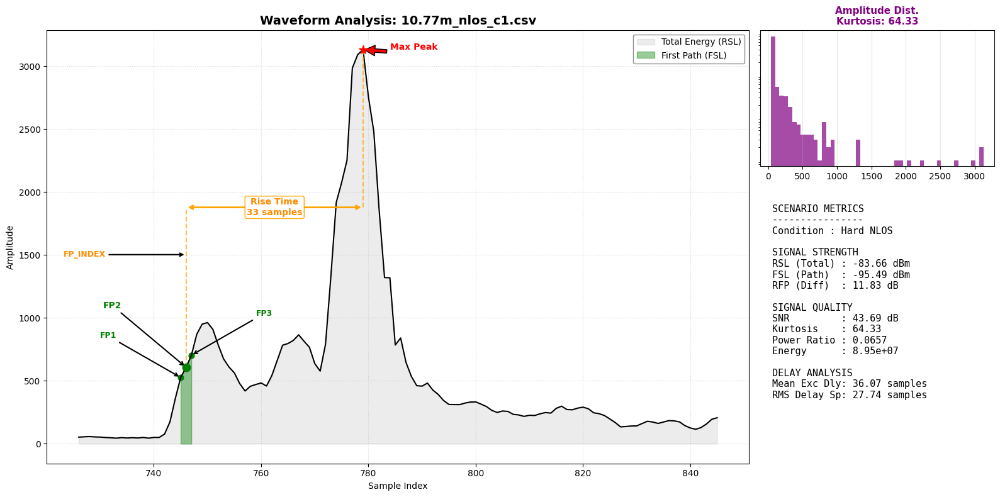

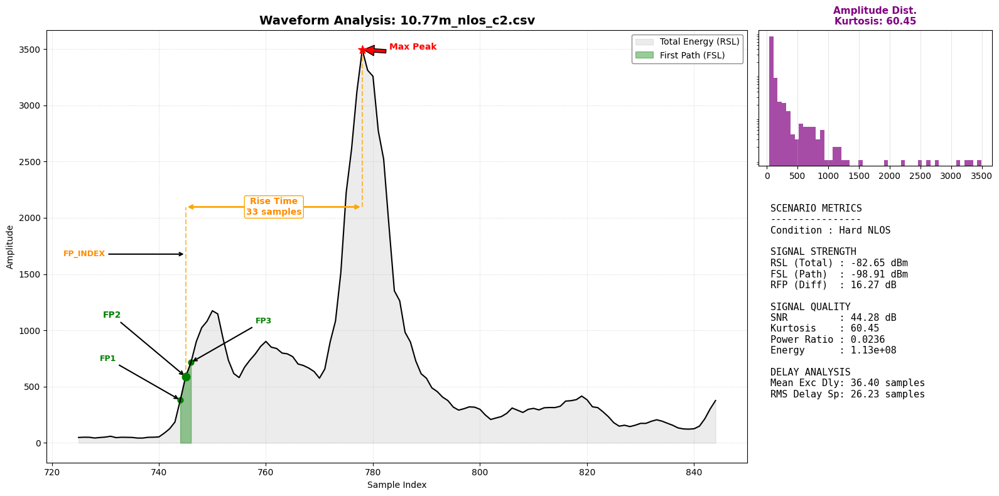

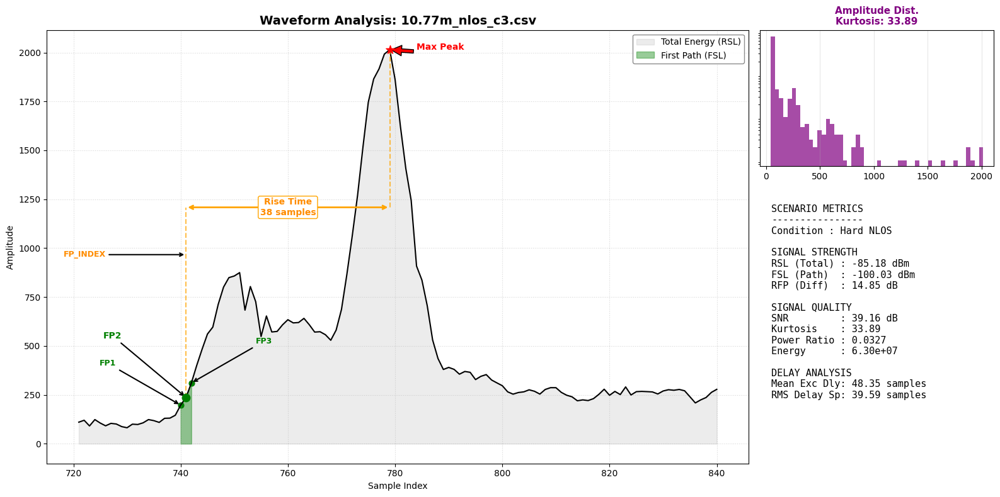

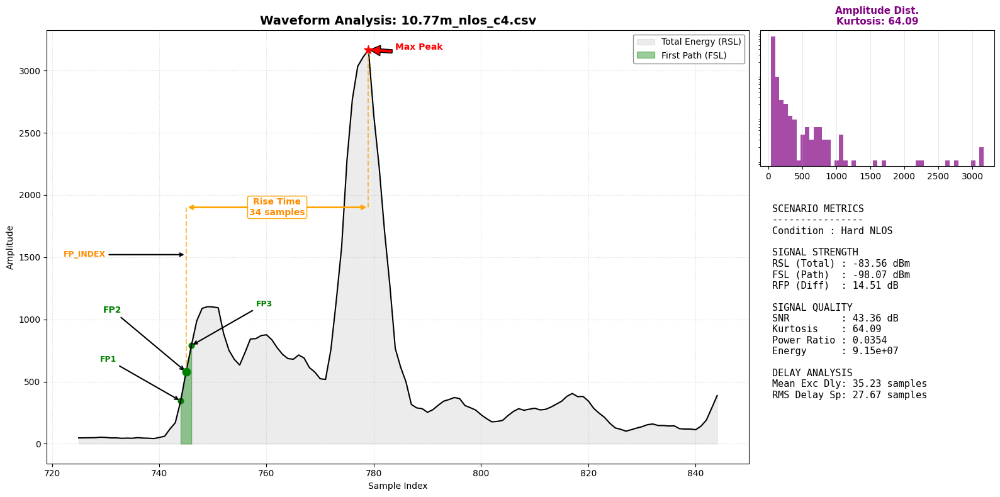

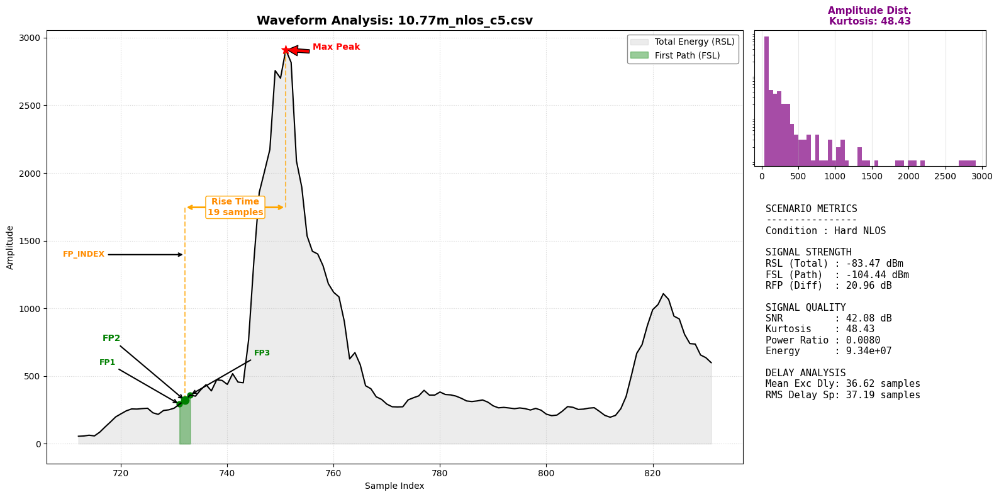

...

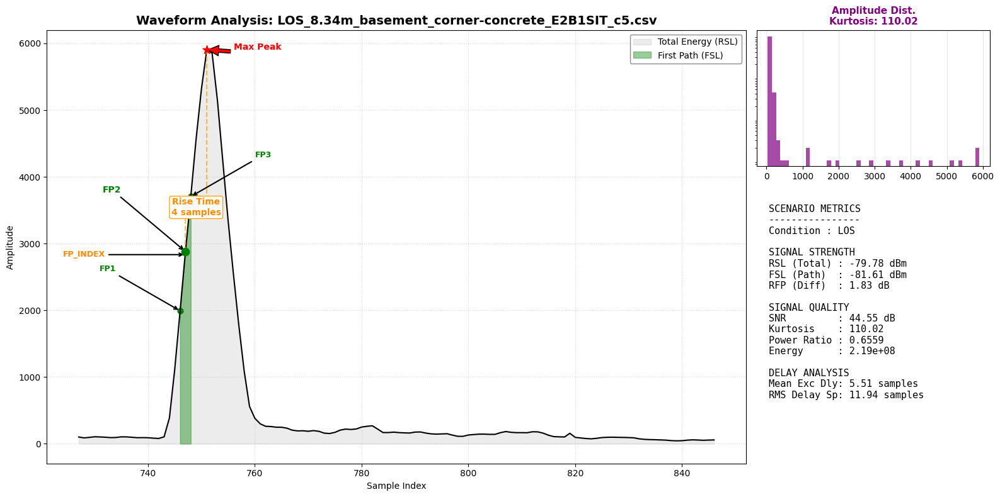

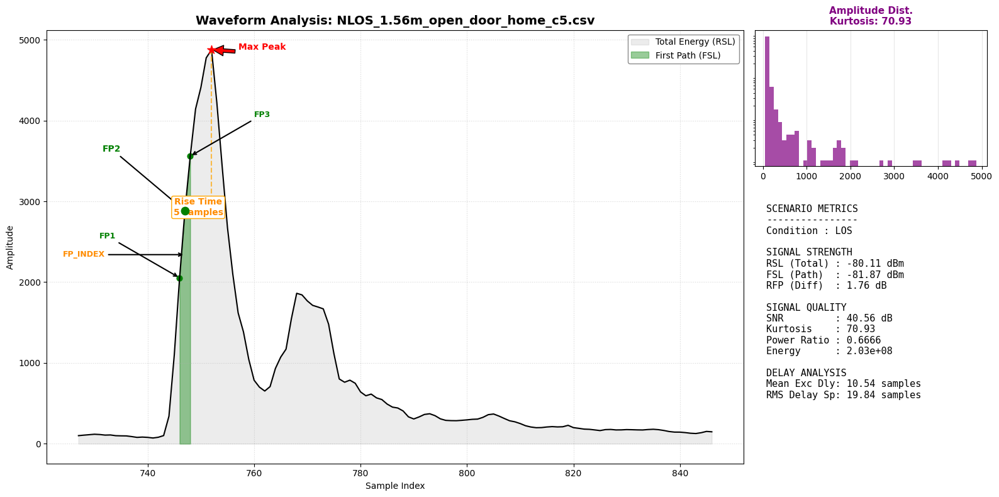

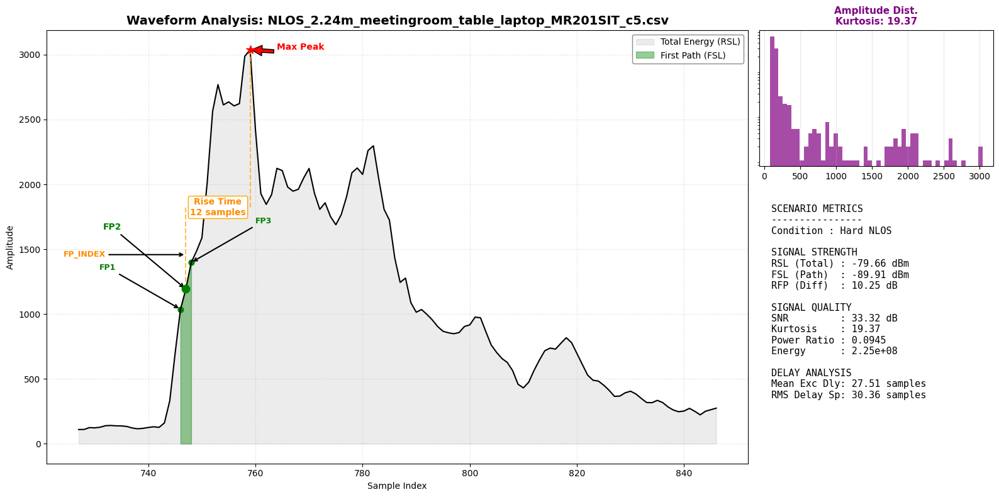

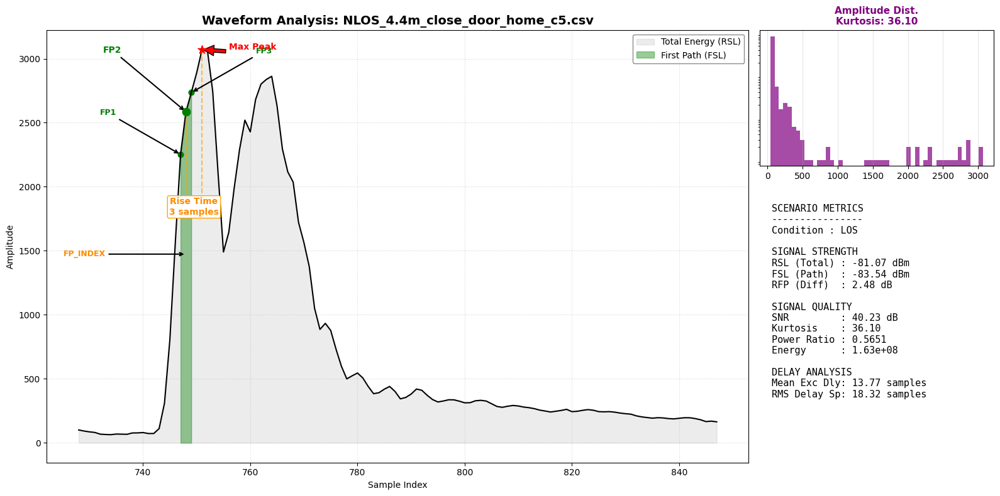

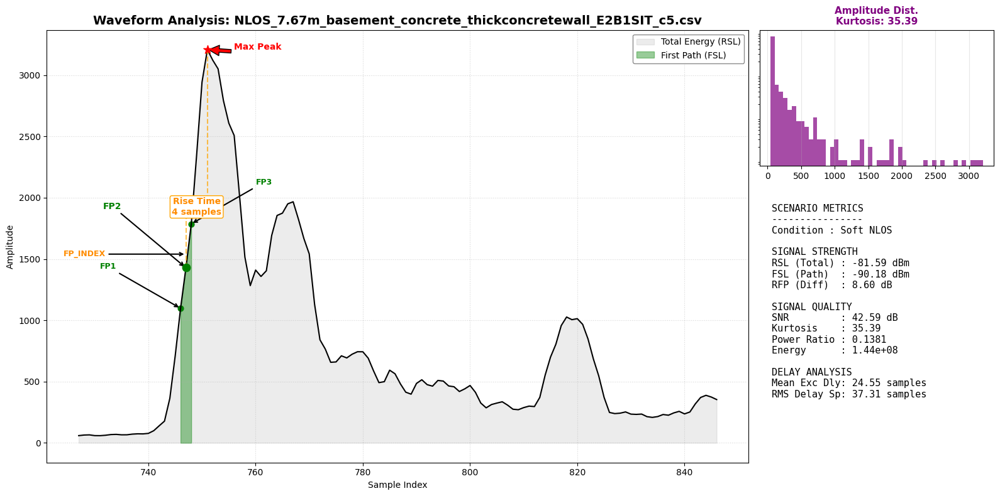

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.gridspec as gridspec
from scipy.stats import kurtosis
import os
import glob
import re

# ==========================================
# 1. METRIC CALCULATION
# ==========================================
def analyze_hardware_dataset(filepath):
    try:
        df = pd.read_csv(filepath)
        cir_cols = sorted([c for c in df.columns if c.startswith('CIR')], key=lambda x: int(x.replace('CIR', '')))
        if not cir_cols: return None 

        raw_waves = df[cir_cols].values 
        avg_wave = np.mean(raw_waves, axis=0)
        
        # Constants
        A = 121.74 
        if 'RXPACC' in df.columns: N = df['RXPACC'].mean()
        elif 'RXP_ACC' in df.columns: N = df['RXP_ACC'].mean()
        else: N = 128.0 

        # --- ENERGY & RSL ---
        raw_sum_squares = np.sum(avg_wave**2)
        if 'CIR_PWR' in df.columns: C = df['CIR_PWR'].mean()
        else: C = raw_sum_squares / (2**17) 
        safe_C = max(C, 1e-9)
        RSL = 10 * np.log10( (safe_C * (2**17)) / (N**2) ) - A

        # --- FSL & FIRST PATH ---
        hw_fp_idx = int(df['FP_INDEX'].mean() / 64)
        idx_f1 = max(0, hw_fp_idx - 1)
        idx_f2 = hw_fp_idx
        idx_f3 = min(len(avg_wave)-1, hw_fp_idx + 1)
        
        # Plot Values
        plot_F1 = avg_wave[idx_f1]
        plot_F2 = avg_wave[idx_f2]
        plot_F3 = avg_wave[idx_f3]
        
        # Math Values
        if 'FP_AMPL1' in df.columns:
            math_F1, math_F2, math_F3 = df['FP_AMPL1'].mean(), df['FP_AMPL2'].mean(), df['FP_AMPL3'].mean()
        else:
            math_F1, math_F2, math_F3 = plot_F1, plot_F2, plot_F3

        F_sum = (math_F1**2) + (math_F2**2) + (math_F3**2)
        safe_F = max(F_sum, 1e-9)
        FSL = 10 * np.log10( safe_F / (N**2) ) - A

        # --- SNR ---
        if 'STD_NOISE' in df.columns: std_noise = df['STD_NOISE'].mean()
        else: std_noise = np.std(avg_wave[0:30])
        max_amp = np.max(avg_wave)
        SNR = 20 * np.log10(max_amp / (std_noise + 1e-9))

        # --- ADDITIONAL METRICS ---
        kurt_val = kurtosis(avg_wave)
        fp_energy_raw = math_F1**2 + math_F2**2 + math_F3**2
        total_energy_raw = np.sum(avg_wave**2)
        power_ratio = fp_energy_raw / max(total_energy_raw, 1e-9)
        
        # --- NEW: DELAY SPREAD CALCULATIONS ---
        # Power Delay Profile starting from First Path
        pdp = avg_wave[hw_fp_idx:]**2
        times = np.arange(len(pdp))
        total_pdp_pwr = np.sum(pdp) + 1e-9
        
        # Mean Excess Delay
        mean_excess_delay = np.sum(pdp * times) / total_pdp_pwr
        
        # RMS Delay Spread
        second_moment = np.sum(pdp * (times**2)) / total_pdp_pwr
        rms_delay_spread = np.sqrt(max(0, second_moment - (mean_excess_delay**2)))
        
        RFP = RSL - FSL
        if RFP < 6.0: condition = "LOS"
        elif RFP <= 10.0: condition = "Soft NLOS"
        else: condition = "Hard NLOS"
        
        peak_idx = np.argmax(avg_wave)
        rise_time = peak_idx - hw_fp_idx

        return {
            "Filename": os.path.basename(filepath),
            "Avg_Wave": avg_wave,
            "HW_FP_Index": hw_fp_idx,
            "Indices": (idx_f1, idx_f2, idx_f3, peak_idx),
            "Plot_Amps": (plot_F1, plot_F2, plot_F3),
            "Max_Amp": max_amp,
            "RSL_dBm": RSL,
            "FSL_dBm": FSL,
            "RFP_Metric": RFP,
            "SNR_dB": SNR,
            "Kurtosis": kurt_val,
            "Power_Ratio": power_ratio,
            "Total_Energy": total_energy_raw,
            "Rise_Time": rise_time,
            "Mean_Excess_Delay": mean_excess_delay,
            "RMS_Delay_Spread": rms_delay_spread,
            "Condition": condition
        }
    except Exception as e: return None

# ==========================================
# 2. PLOTTER (Standard Close Labels)
# ==========================================
def plot_final_standard_labels(scenario_prefix):
    files = glob.glob(f"{scenario_prefix}_c*.csv")
    if not files: return

    for f in sorted(files):
        data = analyze_hardware_dataset(f)
        if not data: continue

        avg_wave = data['Avg_Wave']
        hw_fp = data['HW_FP_Index']
        idx_f1, idx_f2, idx_f3, peak_idx = data['Indices']
        f1, f2, f3 = data['Plot_Amps']
        max_amp = data['Max_Amp']
        
        # --- SETUP GRID ---
        fig = plt.figure(figsize=(16, 8))
        gs = gridspec.GridSpec(2, 2, width_ratios=[3, 1], height_ratios=[1, 2])
        
        ax_main = fig.add_subplot(gs[:, 0])      # Main Waveform
        ax_hist = fig.add_subplot(gs[0, 1])      # Histogram
        ax_text = fig.add_subplot(gs[1, 1])      # Metrics
        
        # --- 1. MAIN WAVEFORM PLOT (Left) ---
        start = max(0, hw_fp - 20)
        end = min(len(avg_wave), hw_fp + 100)
        x_zoom = np.arange(start, end)
        y_zoom = avg_wave[start:end]
        
        # Shading
        ax_main.fill_between(x_zoom, 0, y_zoom, color='gray', alpha=0.15, label='Total Energy (RSL)')
        ax_main.fill_between([idx_f1, idx_f2, idx_f3], 0, [f1, f2, f3], color='green', alpha=0.4, label='First Path (FSL)')
        ax_main.plot(x_zoom, y_zoom, color='black', linewidth=1.5)
        
        # --- POINT ANNOTATIONS (Standard Close Style) ---
        ax_main.scatter(idx_f2, f2, color='green', s=80, zorder=5)
        ax_main.annotate('FP2', xy=(idx_f2, f2), xytext=(idx_f2 - 12, f2 + (max_amp*0.15)),
                    arrowprops=dict(facecolor='green', arrowstyle='->', lw=1.5),
                    fontsize=10, color='green', fontweight='bold', ha='right')

        ax_main.scatter(idx_f1, f1, color='green', s=40)
        ax_main.annotate('FP1', xy=(idx_f1, f1), xytext=(idx_f1 - 12, f1 + (max_amp*0.1)),
                    arrowprops=dict(facecolor='green', arrowstyle='->', lw=1.5), 
                    fontsize=9, color='green', fontweight='bold', ha='right')
        
        ax_main.scatter(idx_f3, f3, color='green', s=40)
        ax_main.annotate('FP3', xy=(idx_f3, f3), xytext=(idx_f3 + 12, f3 + (max_amp*0.1)),
                    arrowprops=dict(facecolor='green', arrowstyle='->', lw=1.5), 
                    fontsize=9, color='green', fontweight='bold', ha='left')

        ax_main.scatter(peak_idx, max_amp, color='red', s=100, marker='*', zorder=5)
        ax_main.annotate('Max Peak', xy=(peak_idx, max_amp), xytext=(peak_idx + 5, max_amp),
                    arrowprops=dict(facecolor='red', shrink=0.05), fontsize=10, color='red', fontweight='bold')
        
        # --- RISE TIME & FP_INDEX ---
        dim_y = max_amp * 0.6 
        ax_main.plot([hw_fp, hw_fp], [f2, dim_y], color='orange', linestyle='--', alpha=0.7)
        ax_main.annotate('FP_INDEX', xy=(hw_fp, dim_y * 0.8), xytext=(hw_fp - 15, dim_y * 0.8),
                         arrowprops=dict(facecolor='orange', arrowstyle='->', lw=1.5),
                         color='darkorange', fontsize=9, fontweight='bold', ha='right', va='center')
        
        ax_main.plot([peak_idx, peak_idx], [max_amp, dim_y], color='orange', linestyle='--', alpha=0.7)
        ax_main.annotate('', xy=(hw_fp, dim_y), xytext=(peak_idx, dim_y), arrowprops=dict(arrowstyle='<->', color='orange', lw=2))
        mid_x = (hw_fp + peak_idx) / 2
        ax_main.text(mid_x, dim_y, f"Rise Time\n{data['Rise_Time']} samples", 
                color='darkorange', fontsize=10, ha='center', va='center', fontweight='bold',
                bbox=dict(facecolor='white', edgecolor='orange', boxstyle='round,pad=0.2'))

        ax_main.legend(loc='upper right', framealpha=0.9, edgecolor='gray')
        ax_main.set_title(f"Waveform Analysis: {data['Filename']}", fontsize=14, fontweight='bold')
        ax_main.set_xlabel("Sample Index")
        ax_main.set_ylabel("Amplitude")
        ax_main.grid(True, linestyle=':', alpha=0.5)

        # --- 2. HISTOGRAM (Top Right) ---
        ax_hist.hist(avg_wave, bins=50, color='purple', alpha=0.7)
        ax_hist.set_title(f"Amplitude Dist.\nKurtosis: {data['Kurtosis']:.2f}", fontsize=11, fontweight='bold', color='purple')
        ax_hist.set_yscale('log')
        ax_hist.tick_params(left=False, labelleft=False)
        ax_hist.grid(axis='x', alpha=0.3)

        # --- 3. METRICS LIST (Bottom Right) ---
        ax_text.axis('off')
        info_text = (
            f"SCENARIO METRICS\n"
            f"----------------\n"
            f"Condition : {data['Condition']}\n\n"
            f"SIGNAL STRENGTH\n"
            f"RSL (Total) : {data['RSL_dBm']:.2f} dBm\n"
            f"FSL (Path)  : {data['FSL_dBm']:.2f} dBm\n"
            f"RFP (Diff)  : {data['RFP_Metric']:.2f} dB\n\n"
            f"SIGNAL QUALITY\n"
            f"SNR         : {data['SNR_dB']:.2f} dB\n"
            f"Kurtosis    : {data['Kurtosis']:.2f}\n"
            f"Power Ratio : {data['Power_Ratio']:.4f}\n"
            f"Energy      : {data['Total_Energy']:.2e}\n\n"
            f"DELAY ANALYSIS\n"
            f"Mean Exc Dly: {data['Mean_Excess_Delay']:.2f} samples\n"
            f"RMS Delay Sp: {data['RMS_Delay_Spread']:.2f} samples"
        )
        ax_text.text(0.05, 0.95, info_text, transform=ax_text.transAxes, fontsize=11, family='monospace', va='top')

        plt.tight_layout()
        plt.show()

# Run
all_csvs = glob.glob("*.csv")
scenarios = sorted(list(set([re.sub(r'_c\d+\.csv$', '', f) for f in all_csvs if "_c" in f])))
for s in scenarios:
    plot_final_standard_labels(s)

Dataset loaded successfully.

📊 FEATURE DISCRIMINATOR POWER TABLE
Feature              | Fisher (FDR) | ROC AUC    | Correlation 
-------------------------------------------------------------------------------------
FSL_dBm              | 8.9704       | 0.9990     | -0.9043     
Total_Energy         | 6.9380       | 0.9877     | -0.8811     
Mean_Excess_Delay    | 5.9982       | 0.9964     | 0.8661      
RMS_Delay_Spread     | 4.5515       | 0.9962     | 0.8336      
Max_Amplitude        | 3.6632       | 0.9582     | -0.8043     
RSL_dBm              | 2.7465       | 0.9877     | -0.7608     
RFP_Metric           | 1.6506       | 0.9082     | 0.6725      
Power_Ratio          | 1.6344       | 0.9082     | -0.6707     
Rise_Time            | 0.5495       | 0.7546     | 0.4644      
Kurtosis             | 0.0042       | 0.5143     | 0.0460      


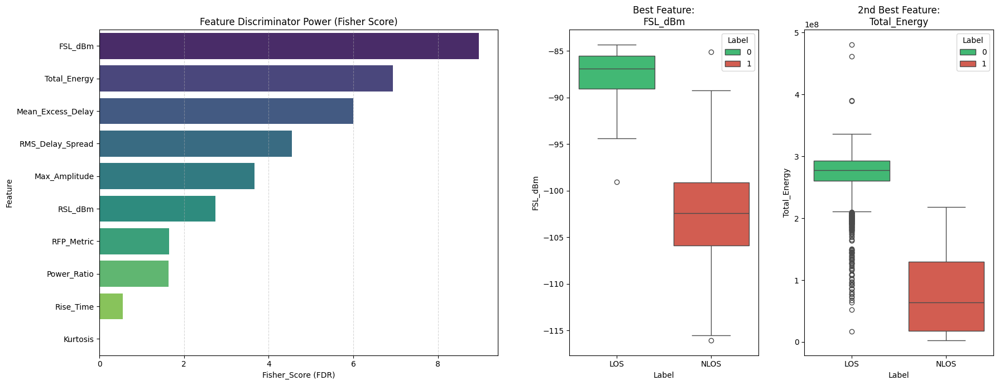

In [5]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import kurtosis
from sklearn.metrics import roc_auc_score

# ==========================================
# 1. SETUP & LOAD DATA
# ==========================================
filepath = "combined_uwb_dataset.csv"
A = 121.74  # PRF 64 MHz constant for DW1000

try:
    df = pd.read_csv(filepath)
    print("Dataset loaded successfully.")
except FileNotFoundError:
    print("Error: File not found.")
    df = pd.DataFrame() 

cir_cols = sorted([c for c in df.columns if c.startswith('CIR')], key=lambda x: int(x.replace('CIR', '')))

# ==========================================
# 2. FEATURE EXTRACTION
# ==========================================
data = []

if not df.empty:
    for idx, row in df.iterrows():
        # Get Preamble Accumulation Count (N)
        if 'RXPACC' in row: N = float(row['RXPACC'])
        elif 'RXP_ACC' in row: N = float(row['RXP_ACC'])
        else: N = 128.0 
            
        sig = pd.to_numeric(row[cir_cols], errors='coerce').fillna(0).astype(float).values
        if len(sig) == 0: continue
        
        peak_idx = np.argmax(sig)
        peak_val = sig[peak_idx]
        
        try:
            hw_fp_index = float(row['FP_INDEX']) / 64.0
        except (KeyError, ValueError):
            hw_fp_index = peak_idx 
        
        # --- NEW: DELAY SPREAD CALCULATIONS ---
        # Power Delay Profile (PDP) starting from the First Path
        pdp = sig[int(hw_fp_index):]**2
        total_pdp_pwr = np.sum(pdp) + 1e-9
        times = np.arange(len(pdp))
        
        # Mean Excess Delay
        mean_excess_delay = np.sum(pdp * times) / total_pdp_pwr
        # RMS Delay Spread
        second_moment = np.sum(pdp * (times**2)) / total_pdp_pwr
        rms_delay_spread = np.sqrt(max(0, second_moment - (mean_excess_delay**2)))

        # Standard Features
        rise_time = peak_idx - hw_fp_index
        c_max = peak_val
        raw_energy = np.sum(sig**2)
        safe_energy = max(raw_energy, 1e-9)
        
        # Power Metrics
        rsl_dbm = 10 * np.log10(safe_energy / (N**2)) - A
        fp_int_idx = int(hw_fp_index)
        fp_energy_val = np.sum(sig[max(0, fp_int_idx - 1):min(len(sig), fp_int_idx + 2)]**2)
        safe_fp_energy = max(fp_energy_val, 1e-9)
        fsl_dbm = 10 * np.log10(safe_fp_energy / (N**2)) - A
        
        rfp = rsl_dbm - fsl_dbm
        c_power_ratio = safe_fp_energy / safe_energy
        
        # Kurtosis
        window = sig[max(0, peak_idx - 10):min(len(sig), peak_idx + 30)]
        c_kurt = kurtosis(window) if len(window) > 5 else 0
            
        data.append({
            "Max_Amplitude": c_max,
            "Total_Energy": raw_energy,
            "RSL_dBm": rsl_dbm,
            "FSL_dBm": fsl_dbm,
            "RFP_Metric": rfp,
            "Power_Ratio": c_power_ratio,
            "Kurtosis": c_kurt,
            "Rise_Time": rise_time,
            "Mean_Excess_Delay": mean_excess_delay,
            "RMS_Delay_Spread": rms_delay_spread,
            "Label": row['Label']
        })

    df_features = pd.DataFrame(data)

    # ==========================================
    # 3. FEATURE DISCRIMINATOR ANALYSIS
    # ==========================================
    feature_list = [
        "RFP_Metric", "Power_Ratio", "Kurtosis", 
        "Rise_Time", "RSL_dBm", "FSL_dBm", 
        "Total_Energy", "Max_Amplitude",
        "Mean_Excess_Delay", "RMS_Delay_Spread"
    ]
    
    discriminator_data = []
    los_data = df_features[df_features['Label'] == 0]
    nlos_data = df_features[df_features['Label'] == 1]
    
    for feat in feature_list:
        corr = df_features[feat].corr(df_features['Label'])
        mu0, mu1 = los_data[feat].mean(), nlos_data[feat].mean()
        var0, var1 = los_data[feat].var(), nlos_data[feat].var()
        fisher_score = ((mu0 - mu1)**2) / (var0 + var1 + 1e-9)
        try:
            auc = roc_auc_score(df_features['Label'], df_features[feat])
            auc = max(auc, 1 - auc) 
        except:
            auc = 0.5

        discriminator_data.append({
            "Feature": feat,
            "Fisher_Score (FDR)": fisher_score,
            "ROC_AUC": auc,
            "Correlation": corr
        })
    
    df_power = pd.DataFrame(discriminator_data).sort_values(by="Fisher_Score (FDR)", ascending=False)

    print("\n📊 FEATURE DISCRIMINATOR POWER TABLE")
    print("=" * 85)
    print(f"{'Feature':<20} | {'Fisher (FDR)':<12} | {'ROC AUC':<10} | {'Correlation':<12}")
    print("-" * 85)
    for _, row in df_power.iterrows():
        print(f"{row['Feature']:<20} | {row['Fisher_Score (FDR)']:<12.4f} | {row['ROC_AUC']:<10.4f} | {row['Correlation']:<12.4f}")
    print("=" * 85)

    # ==========================================
    # 4. VISUALIZATION
    # ==========================================
    plt.figure(figsize=(18, 7))
    plt.subplot(1, 2, 1)
    sns.barplot(x="Fisher_Score (FDR)", y="Feature", data=df_power, hue="Feature", palette="viridis")
    plt.title("Feature Discriminator Power (Fisher Score)")
    plt.grid(axis='x', linestyle='--', alpha=0.5)

    top_2_features = df_power['Feature'].head(2).values
    plt.subplot(1, 4, 3) 
    sns.boxplot(x='Label', y=top_2_features[0], data=df_features, hue='Label', palette=['#2ecc71', '#e74c3c'])
    plt.title(f"Best Feature:\n{top_2_features[0]}")
    plt.xticks([0, 1], ['LOS', 'NLOS'])
    
    plt.subplot(1, 4, 4)
    sns.boxplot(x='Label', y=top_2_features[1], data=df_features, hue='Label', palette=['#2ecc71', '#e74c3c'])
    plt.title(f"2nd Best Feature:\n{top_2_features[1]}")
    plt.xticks([0, 1], ['LOS', 'NLOS'])

    plt.tight_layout()
    plt.savefig("discriminator_power_analysis.png")
    plt.show()

- Metric,LOS (4.55m),NLOS (7.79m),LNN Conclusion
- MaxAmp,High (>5000),Low (~800-1300),Blockage is present.
- Rise_ns,Fast (~3-5ns),Slow (~6-9ns),Leading edge is obstructed.
- Width,Narrow (~3-5),Broad (~8-21),Signal is reflecting/scattering.
- MED,Low (<9),High (>14),Energy is delayed by geometry.

In [2]:
import pandas as pd
import glob
import os

def combine_all_datasets(search_path='.'):
    """
    Finds all LOS/NLOS csv files, labels them, and combines them into one.
    """
    # 1. Find all CSV files (recursive search in subfolders too)
    patterns = [
        os.path.join(search_path, "*.csv"),
        os.path.join(search_path, "dataset", "*.csv"),
        os.path.join(search_path, "channel", "*.csv")
    ]
    all_files = sorted(list(set([f for p in patterns for f in glob.glob(p)])))
    
    if not all_files:
        print("❌ No CSV files found!")
        return None

    print(f"🔍 Found {len(all_files)} files. Combining...")

    combined_data = []

    for filename in all_files:
        try:
            # 2. Determine Label
            fname = os.path.basename(filename).lower()
            if 'nlos' in fname:
                label = 1  # NLOS
                label_str = "NLOS"
            elif 'los' in fname:
                label = 0  # LOS
                label_str = "LOS"
            else:
                print(f"⚠️ Skipping {fname}: Cannot determine LOS/NLOS from name.")
                continue

            # 3. Load Data
            df = pd.read_csv(filename)
            
            # Add metadata columns for tracking
            df['Label'] = label
            df['Source_File'] = fname
            
            # Reorder columns: Put Label and Source_File at the start
            cols = ['Label', 'Source_File'] + [c for c in df.columns if c not in ['Label', 'Source_File']]
            df = df[cols]
            
            combined_data.append(df)
            print(f"   ✅ Added {fname:<20} ({len(df)} samples) -> {label_str}")

        except Exception as e:
            print(f"   ❌ Error reading {filename}: {e}")

    # 4. Concatenate
    if combined_data:
        master_df = pd.concat(combined_data, ignore_index=True)
        
        print("\n" + "="*40)
        print("🎉 COMBINATION COMPLETE")
        print(f"Total Samples: {len(master_df)}")
        print(f"Total Columns: {len(master_df.columns)}")
        print("Label Distribution:")
        print(master_df['Label'].value_counts())
        print("="*40)
        
        # 5. Save to Disk
        output_filename = "combined_uwb_dataset.csv"
        master_df.to_csv(output_filename, index=False)
        print(f"💾 Saved master dataset to: {output_filename}")
        
        return master_df
    else:
        return None

# Run it
df_combined = combine_all_datasets()

🔍 Found 36 files. Combining...
   ✅ Added 10.77m_nlos_c1.csv   (100 samples) -> NLOS
   ✅ Added 10.77m_nlos_c2.csv   (100 samples) -> NLOS
   ✅ Added 10.77m_nlos_c3.csv   (100 samples) -> NLOS
   ✅ Added 10.77m_nlos_c4.csv   (100 samples) -> NLOS
   ✅ Added 10.77m_nlos_c5.csv   (100 samples) -> NLOS
   ✅ Added 10.77m_nlos_c7.csv   (100 samples) -> NLOS
   ✅ Added 14m_nlos_c1.csv      (100 samples) -> NLOS
   ✅ Added 14m_nlos_c2.csv      (100 samples) -> NLOS
   ✅ Added 14m_nlos_c3.csv      (100 samples) -> NLOS
   ✅ Added 14m_nlos_c4.csv      (100 samples) -> NLOS
   ✅ Added 14m_nlos_c5.csv      (100 samples) -> NLOS
   ✅ Added 14m_nlos_c7.csv      (100 samples) -> NLOS
   ✅ Added 4.55m_los_c1.csv     (100 samples) -> LOS
   ✅ Added 4.55m_los_c2.csv     (100 samples) -> LOS
   ✅ Added 4.55m_los_c3.csv     (100 samples) -> LOS
   ✅ Added 4.55m_los_c4.csv     (100 samples) -> LOS
   ✅ Added 4.55m_los_c5.csv     (100 samples) -> LOS
   ✅ Added 4.55m_los_c7.csv     (100 samples) -> LOS
   